In [1]:
# Common imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc

plt.style.use('fivethirtyeight')
rc('animation', html='jshtml')

# Copy the models
from copy import deepcopy

# Sklearn imports
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score

# Entropy function
from scipy.stats import entropy

# Progress helper
from IPython.display import clear_output

## QBC by posterior sampling

### Interesting fact: For probabilistic models, QBC is similar to uncertainty sampling. How?


* #### Draw $k$ parameter sets from the posterior distribution representing $k$ different models.
* #### Query a point which shows maximum disagreement among the points.

## An example: Bayesian linear regression

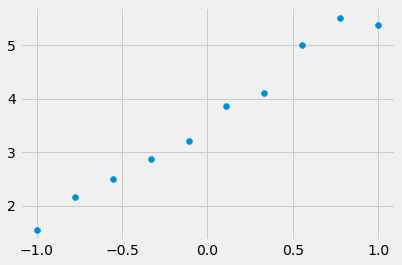

In [2]:
np.random.seed(0)
N = 10
X = np.linspace(-1,1,N).reshape(-1,1)

t0 = 3
t1 = 2

y = X * t1 + t0 + np.random.rand(N,1)

plt.scatter(X, y);

### Assume a posterior

In [3]:
n_samples = 50

t0_dist_samples = np.random.normal(t0, 0.1, size=n_samples)
t1_dist_samples = np.random.normal(t1, 1, size=n_samples)

### Plot the models

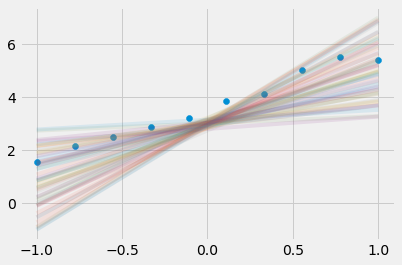

In [4]:
plt.scatter(X, y)

for i in range(len(t0_dist_samples)):
    sample_t0 = t0_dist_samples[i]
    sample_t1 = t1_dist_samples[i]
    
    plt.plot(X, X * sample_t1 + sample_t0,alpha=0.1)

## QBC by bootstrapping

### 2 class dataset

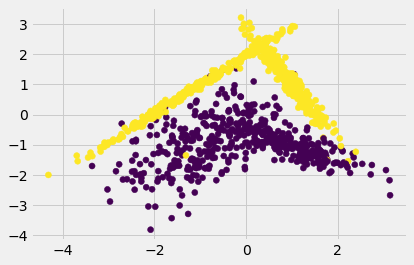

In [5]:
X, y = make_classification(n_samples=1000, n_features=2, n_informative=2, n_redundant=0, random_state=3, shuffle=True)

plt.figure()
plt.scatter(X[:,0], X[:,1], c=y);

### Full data fit with RF

In [6]:
model = RandomForestClassifier(random_state=0)
model.fit(X, y);

RandomForestClassifier(random_state=0)

### Visualize decision boundary

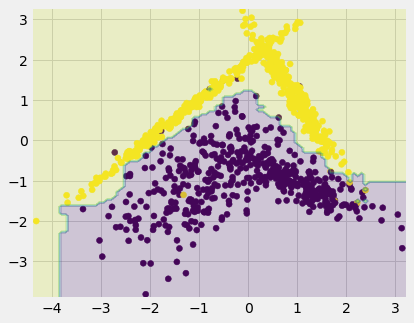

In [7]:
grid_X1, grid_X2 = np.meshgrid(np.linspace(X[:,0].min()-0.1, X[:,0].max()+0.1, 100), 
                    np.linspace(X[:,1].min()-0.1, X[:,1].max()+0.1, 100))

grid_X = [(x1, x2) for x1, x2 in zip(grid_X1.ravel(), grid_X2.ravel())]

grid_pred = model.predict(grid_X)

plt.figure(figsize=(6,5))
plt.scatter(X[:,0], X[:,1], c=y);
plt.contourf(grid_X1, grid_X2, grid_pred.reshape(*grid_X1.shape), alpha=0.2);

### Train, pool, test split

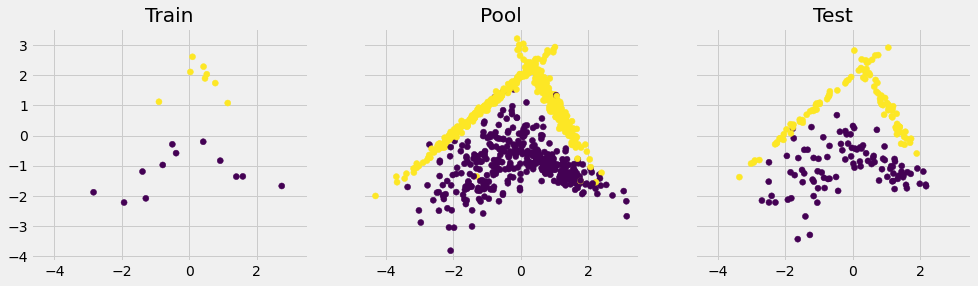

In [8]:
X_train_pool, X_test, y_train_pool, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)
X_train, X_pool, y_train, y_pool = train_test_split(X_train_pool, y_train_pool, train_size=20, random_state=0)

X_list = [X_train, X_pool, X_test]
y_list = [y_train, y_pool, y_test]
t_list = ['Train', 'Pool', 'Test']

fig, ax = plt.subplots(1,3,figsize=(15,4), sharex=True, sharey=True)
for i in range(3):
    ax[i].scatter(X_list[i][:,0], X_list[i][:,1], c=y_list[i])
    ax[i].set_title(t_list[i])
    

### Fitting a model on initial train data

In [9]:
AL_model = RandomForestClassifier(n_jobs=28, random_state=0)

AL_model.fit(X_train, y_train);

RandomForestClassifier(n_jobs=28, random_state=0)

### Get the votes from trees on pool dataset

In [10]:
votes = np.zeros(shape=(X_pool.shape[0], len(AL_model.estimators_)))

for learner_idx, learner in enumerate(AL_model.estimators_):
    votes[:, learner_idx] = learner.predict(X_pool)

In [11]:
votes.shape

(780, 100)

In [12]:
votes

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 1., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### Convert to probabilities

In [13]:
p_vote = np.zeros(shape=(X_pool.shape[0], X_pool.shape[1]))

for vote_idx, vote in enumerate(votes):
    vote_counter = {0 : (1-vote).sum(), 1 : vote.sum()}

    for class_idx, class_label in enumerate(range(X.shape[1])):
        p_vote[vote_idx, class_idx] = vote_counter[class_label]/len(AL_model.estimators_)

In [14]:
p_vote

array([[1.  , 0.  ],
       [0.89, 0.11],
       [0.06, 0.94],
       ...,
       [0.93, 0.07],
       [1.  , 0.  ],
       [1.  , 0.  ]])

### Calculate dissimilarity (entropy)

In [15]:
example_id = 2

In [16]:
ans = 0
for category in range(X_pool.shape[1]):
    ans += (-p_vote[example_id][category] * np.log(p_vote[example_id][category]))

ans

0.22696752250060448

In [17]:
entr = entropy(p_vote, axis=1)

In [18]:
entr[example_id]

0.22696752250060448

### Active Learning Flow

In [19]:
def get_query_idx():
    # Gather the votes
    votes = np.zeros(shape=(X_pool.shape[0], len(AL_model.estimators_)))
    for learner_idx, learner in enumerate(AL_model.estimators_):
        votes[:, learner_idx] = learner.predict(X_pool)
    
    # Calcuate probability of votes
    p_vote = np.zeros(shape=(X_pool.shape[0], X_pool.shape[1]))
    for vote_idx, vote in enumerate(votes):
        vote_counter = {0 : (1-vote).sum(), 
                    1 : vote.sum()}

        for class_idx, class_label in enumerate(range(X.shape[1])):
            p_vote[vote_idx, class_idx] = vote_counter[class_label]/len(AL_model.estimators_)
    
    # Calculate entropy for each example
    entr = entropy(p_vote, axis=1)
    
    # Choose example with highest entropy (disagreement)
    return entr.argmax()

### Prepare data for random sampling

In [20]:
X_train_rand = X_train.copy()
y_train_rand = y_train.copy()
X_pool_rand = X_pool.copy()
y_pool_rand = y_pool.copy()

random_model = RandomForestClassifier(n_jobs=28, random_state=0)

### Run active learning

In [21]:
AL_iters = 100
np.random.seed(0)

AL_inds = []
AL_models = []
random_inds = []
random_models = []

for iteration in range(AL_iters):
    clear_output(wait=True)
    print("iteration", iteration)
    ######## Active Learning ############
    # Fit the model
    AL_model.fit(X_train, y_train)
    AL_models.append(deepcopy(AL_model))
    
    # Query a point
    query_idx = get_query_idx()
    AL_inds.append(query_idx)
    
    # Add it to the train data
    X_train = np.concatenate([X_train, X_pool[query_idx:query_idx+1, :]], axis=0)
    y_train = np.concatenate([y_train, y_pool[query_idx:query_idx+1]], axis=0)
    
    # Remove it from the pool data
    X_pool = np.delete(X_pool, query_idx, axis=0)
    y_pool = np.delete(y_pool, query_idx, axis=0)
    
    ######## Random Sampling ############
     # Fit the model
    random_model.fit(X_train_rand, y_train_rand)
    random_models.append(deepcopy(random_model))
    
    # Query a point
    query_idx = np.random.choice(len(X_pool))
    random_inds.append(query_idx)
    # Add it to the train data
    X_train_rand = np.concatenate([X_train_rand, X_pool_rand[query_idx:query_idx+1, :]], axis=0)
    y_train_rand = np.concatenate([y_train_rand, y_pool_rand[query_idx:query_idx+1]], axis=0)
    
    # Remove it from the pool data
    X_pool_rand = np.delete(X_pool_rand, query_idx, axis=0)
    y_pool_rand = np.delete(y_pool_rand, query_idx, axis=0)

iteration 99


### Plot accuracy

iteration 99


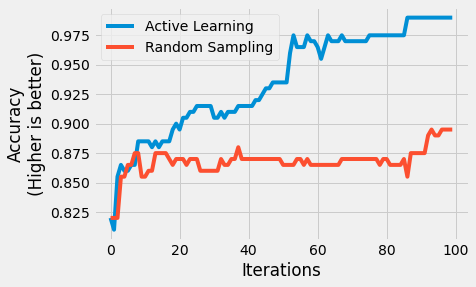

In [22]:
random_scores = []
AL_scores = []
for iteration in range(AL_iters):
    clear_output(wait=True)
    print("iteration", iteration)
    AL_scores.append(accuracy_score(y_test, AL_models[iteration].predict(X_test)))
    random_scores.append(accuracy_score(y_test, random_models[iteration].predict(X_test)))
    
plt.plot(AL_scores, label='Active Learning');
plt.plot(random_scores, label='Random Sampling');
plt.legend();
plt.xlabel('Iterations');
plt.ylabel('Accuracy\n(Higher is better)');

### Plot decision boundary

In [23]:
def update(i):
    for each in ax:
        each.cla()
        
    AL_grid_preds = AL_models[i].predict(grid_X)
    random_grid_preds = random_models[i].predict(grid_X)
    
    # Active learning
    ax[0].scatter(X_train[:n_train,0], X_train[:n_train,1], c=y_train[:n_train], label='initial_train', alpha=0.2)
    ax[0].scatter(X_train[n_train:n_train+i, 0], X_train[n_train:n_train+i, 1], 
                  c=y_train[n_train:n_train+i], label='new_points')
    ax[0].contourf(grid_X1, grid_X2, AL_grid_preds.reshape(*grid_X1.shape), alpha=0.2);
    ax[0].set_title('New points')
    
    ax[1].scatter(X_test[:, 0], X_test[:, 1], c=y_test, label='test_set')
    ax[1].contourf(grid_X1, grid_X2, AL_grid_preds.reshape(*grid_X1.shape), alpha=0.2);
    ax[1].set_title('Test points');
    ax[0].text(locs[0],locs[1],'Active Learning')
    
    # Random sampling
    ax[2].scatter(X_train_rand[:n_train,0], X_train_rand[:n_train,1], c=y_train_rand[:n_train], label='initial_train', alpha=0.2)
    ax[2].scatter(X_train_rand[n_train:n_train+i, 0], X_train_rand[n_train:n_train+i, 1], 
                  c=y_train_rand[n_train:n_train+i], label='new_points')
    ax[2].contourf(grid_X1, grid_X2, random_grid_preds.reshape(*grid_X1.shape), alpha=0.2);
    ax[2].set_title('New points')
    
    ax[3].scatter(X_test[:, 0], X_test[:, 1], c=y_test, label='test_set')
    ax[3].contourf(grid_X1, grid_X2, random_grid_preds.reshape(*grid_X1.shape), alpha=0.2);
    ax[3].set_title('Test points');
    ax[2].text(locs[0],locs[1],'Random Sampling');

In [25]:
locs = (2.7, 4)
fig, ax = plt.subplots(2,2,figsize=(12,6), sharex=True, sharey=True)
ax = ax.ravel()
n_train = X_train.shape[0]-AL_iters

anim = FuncAnimation(fig, func=update, frames=range(100))
plt.close()
anim